# Pipeline for image size estimation

Imports

In [21]:
# basics
import numpy as np
import pandas as pd
import math
from tqdm import tqdm
# file work
import os
import json
# computer vision
import cv2
import laser_detection as ld
# models
from segment_anything import sam_model_registry, SamPredictor
from easy_ViTPose import VitInference
from huggingface_hub import hf_hub_download

/opt/anaconda3/envs/fzwz/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Step 0: Assign input point to each image

run: 'python3 label.py' to get json of image names and input points (change path to folder in script)

## Step 1: Load image data from json

In [2]:
# path to json file
json_file = 'red_lasers/im_data.json'

# folder containing images
image_folder = 'red_lasers/new_sample_data'

# load data
with open(json_file, 'r') as file:
    image_data = json.load(file)

In [3]:
len(image_data)

8

Some helper functions for displaying images

In [4]:
# function to show mask
def show_mask(mask, ax):
    color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

# function to show input point
def show_points(points, ax):
    ax.scatter(points[:, 0], points[:, 1], color='blue', marker='*', s=250, edgecolor='white', linewidth=1.25)

### let's visualize labels from json

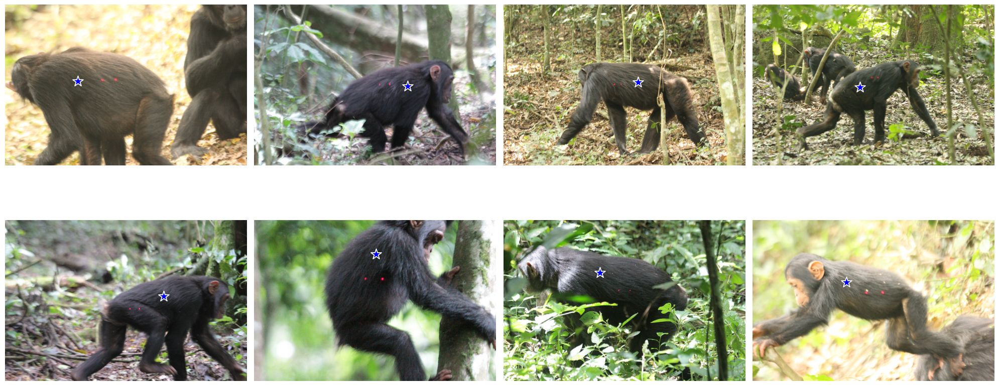

In [5]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
        show_points(input_point, axs[idx])
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Looks good!

## Step 2: Run images through SAM to prep for laser detection

### ***only need to run this code once to get masks!!!

Set up SAM

In [6]:
# select checkpoint and model type
sam_checkpoint = "../sam_vit_h_4b8939.pth"
model_type = "vit_h"

# define predictor
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)

In [7]:
def generate_mask(im, input_point):
    input_label = np.array([1])
    predictor.set_image(im)
    masks, scores, _ = predictor.predict(point_coords=input_point, point_labels=input_label, multimask_output=True)
    # return best mask
    return masks[np.argmax(scores)]

Iterate through images and get mask

In [8]:
# paths
mask_folder = 'red_lasers/new_sample_data_masks'

# Ensure mask folder exists
os.makedirs(mask_folder, exist_ok=True)

In [9]:
from tqdm import tqdm
# iterate through each entry in the JSON data
for image_name, im_data in tqdm(image_data.items(), desc="Processing Images"):
    image_path = os.path.join(image_folder, image_name)
    
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])
        # Generate the mask
        mask = generate_mask(img, input_point)
        mask = mask.astype(np.uint8)
        
        # Define the mask filename
        mask_filename = os.path.splitext(image_name)[0] + "_mask.png"
        mask_path = os.path.join(mask_folder, mask_filename)
        
        # Save the mask
        cv2.imwrite(mask_path, mask)
        
        # Update the JSON data with the mask filename
        image_data[image_name]['mask'] = mask_filename

# Write the updated JSON data to a file
with open(json_file, 'w') as file:
    json.dump(image_data, file, indent=4)

print(f"Updated data saved to {json_file}")

Processing Images: 100%|██████████| 8/8 [03:12<00:00, 24.04s/it]

Updated data saved to red_lasers/im_data.json


### let's checkout the results

In [11]:
# Load the JSON data
with open(json_file, 'r') as up_file:
    image_data = json.load(up_file)

viewing masks: 100%|██████████| 8/8 [00:03<00:00,  2.57it/s]


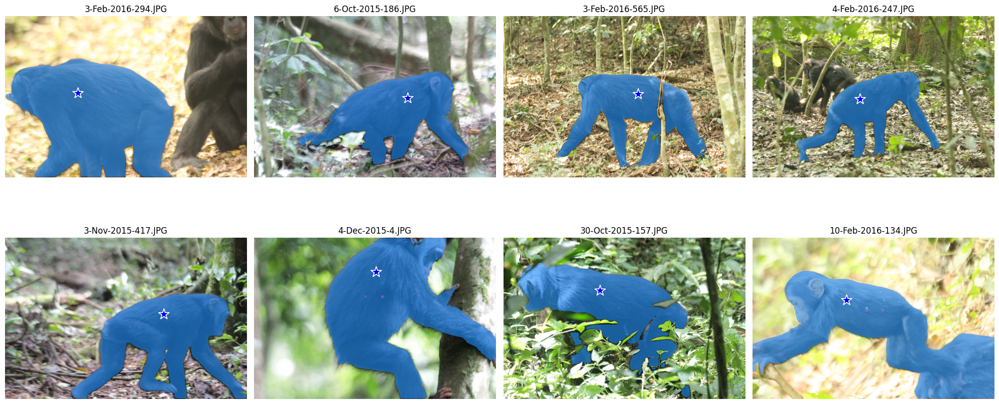

In [13]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in tqdm(image_data.items(), desc="viewing masks"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # Load the mask
    mask_filename = im_data['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    if img is not None:
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
        show_points(input_point, axs[idx])
        show_mask(mask, axs[idx])
        axs[idx].axis('off')
        axs[idx].set_title(image_name)

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Good stuff

## Step 3: laser point detection

In [10]:
import laser_detection as ld
import importlib
importlib.reload(ld)

<module 'laser_detection' from '/Users/jbrandinger/Documents/DS Capstone/fuzzy-wuzzy/laser_detection.py'>

In [14]:
idx = 0
# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="detecting lasers"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    source = cv2.imread(image_path)

    # Load the mask
    mask_filename = info['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    mask = mask > 0  # need to convert to boolean values

    if source is not None:
        # run laser detection image
        points = ld.detect_laser_points(source, mask)
        if len(points) < 2:
            print("Less than two lasers detected. Retrying without mask...")
            points = ld.detect_laser_points(source, np.ones(source.shape, dtype=bool))
            print(f"Detected {len(points)} points without mask")
        
        # Update the JSON data with the mask filename
        image_data[image_name]['laser_points'] = points

# Write the updated JSON data to a file
with open(json_file, 'w') as file:
    json.dump(image_data, file, indent=4)

print(f"Updated data saved to {json_file}")

detecting lasers: 100%|██████████| 8/8 [01:43<00:00, 12.95s/it]

Updated data saved to red_lasers/im_data.json


let's checkout the results

In [19]:
def draw_dots(points, ax):
    ax.scatter(points[:, 0], points[:, 1], color='skyblue', s=10)

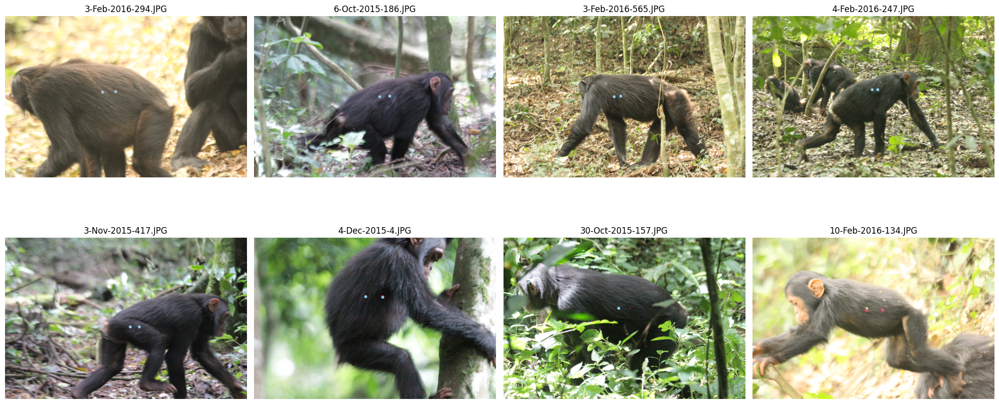

In [20]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # Load the mask
    mask_filename = info['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    if img is not None:
        # extract coordinates
        points = np.array(info['laser_points'])

        # plot image
        axs[idx].imshow(img)
        if len(points != 0):
            draw_dots(points, axs[idx])
            axs[idx].set_title(image_name)
        else:
            axs[idx].set_title(f"{image_name} (No lasers detected)")
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

### Step 4: Run VitPose

In [22]:
# define model parameters
MODEL_SIZE = 'b'
YOLO_SIZE = 'n'
DATASET = 'apt36k'
ext = '.pth'
ext_yolo = '.pt'

# download model_path and yolo_path
MODEL_TYPE = "torch"
YOLO_TYPE = "torch"
REPO_ID = 'JunkyByte/easy_ViTPose'
FILENAME = os.path.join(MODEL_TYPE, 
                        f'{DATASET}/vitpose-' + MODEL_SIZE + f'-{DATASET}') + ext
FILENAME_YOLO = 'yolov8/yolov8' + YOLO_SIZE + ext_yolo
print(f'Downloading model {REPO_ID}/{FILENAME}')
model_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME)
yolo_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME_YOLO)

In [23]:
# initialize model
model = VitInference(model_path, yolo_path, MODEL_SIZE, dataset=DATASET)

In [52]:
# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="ViTPose"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # get keypoints
    img_arr = np.array(img, dtype=np.uint8)
    keypoints = model.inference(img_arr)

    if keypoints:
      # store results
      shoulder = keypoints[0][3]
      shoulder = [int(shoulder[1]), int(shoulder[0])]
      rump = keypoints[0][4]
      rump = [int(rump[1]), int(rump[0])]
      # Update the JSON data with shoulder and rump
      image_data[image_name]['shoulder_rump'] = [shoulder, rump]
    else:
      print(f"vitpose failed for {image_path}")
      # TODO how do we want to handle this case in the json?
      image_data[image_name]['shoulder_rump'] = None

ViTPose:  75%|███████▌  | 6/8 [00:00<00:00,  7.78it/s]

vitpose failed for red_lasers/new_sample_data/3-Nov-2015-417.JPG


ViTPose: 100%|██████████| 8/8 [00:01<00:00,  6.64it/s]


In [58]:
if image_data['3-Nov-2015-417.JPG']['shoulder_rump'] is None:
    print("yes")

yes


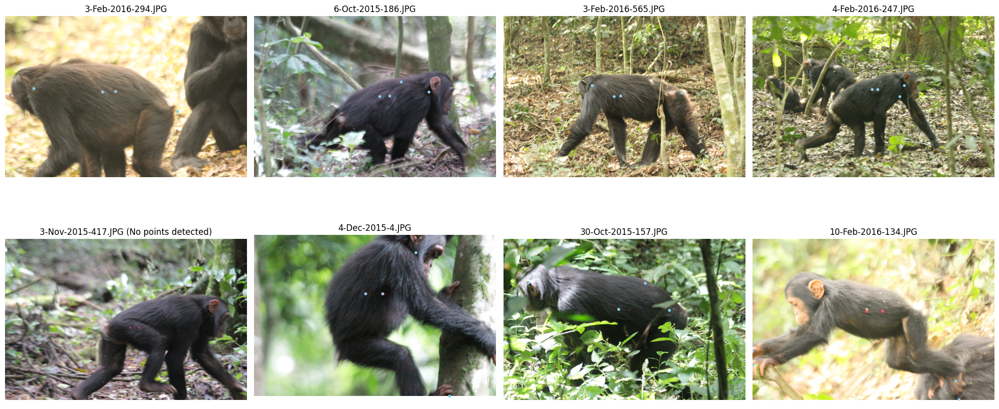

In [61]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    if img is not None:
        # extract coordinates
        points1 = info['shoulder_rump']
        points2 = info['laser_points']

        # plot image
        axs[idx].imshow(img)
        if points1 is not None:
            draw_dots(np.array(points1), axs[idx])
            draw_dots(np.array(points2), axs[idx])
            axs[idx].set_title(image_name)
        else:
            axs[idx].set_title(f"{image_name} (No points detected)")
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

### Step 5: get distances

In [68]:
measured_df = pd.read_csv('../measured.csv')
measured_df = measured_df.dropna(subset=['PhotoID'])
conversion_dict = dict(zip(measured_df['PhotoID'], measured_df['Laser Width']))
true_dist_dcit = dict(zip(measured_df['PhotoID'], measured_df['BodyLength1']))

In [70]:
# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="Calculating Final Distances"):
    # distances in pixels
    laser_points = info['laser_points']
    shoulder_rump = info['shoulder_rump']

    # assert we have values
    if laser_points is None or shoulder_rump is None:
        continue
    
    # calculate ratio
    laser_dist = round(math.dist(points[0], points[1]), 3)
    sr_dist = round(math.dist(shoulder_rump[0], shoulder_rump[1]), 3)
    ratio = laser_dist / sr_dist
    
    # lookup laser width
    id = image_name.split('.')[0]
    laser_width = conversion_dict[id]
    body_length = laser_width / ratio
    print(f"Calculated length: {body_length}\tactual length: {true_dist_dcit[id]}")

Calculating Final Distances: 100%|██████████| 8/8 [00:00<00:00, 35062.10it/s]

Calculated length: 47.620238053097346	actual length: 50.08169014
Calculated length: 6.482967256637169	actual length: 39.61111111
Calculated length: 29.576982300884954	actual length: 66.18096883
Calculated length: 3.972425663716814	actual length: 55.775
Calculated length: 32.14591946902655	actual length: 34.08066298
Calculated length: 7.799076106194691	actual length: 52.19669421
Calculated length: 6.155451327433629	actual length: 28.63193916


In [67]:
measured_df

,PhotoID,Series,ChimpID_Final,sex,Age,ID_Confirmed,Date,Batch,Priority to Measure,Photographer,...,Measurer2,PixLaser1,PixLength1,BodyLength1,PixLaser2,PixLength2,BodyLength2,MeanLength,CV,Notes
0,17-Nov-2015-777,17-Nov-2015-777,AE,F,1.7,YES,17-Nov-15,2015.0,2=Medium,SylvanWhitmore,...,NaN,128.000000,794.000000,28.534375,NaN,NaN,NaN,28.534375,NaN,NaN
1,20140307-IMG_0431,20140307-IMG_0431,AE,F,0.0,YES,07-Mar-14,2013.0,2=Medium,NickBrazeau,...,NaN,235.000000,866.000000,16.951489,NaN,NaN,NaN,16.951489,NaN,NaN
2,20140307-IMG_0432,20140307-IMG_0431,AE,F,0.0,YES,07-Mar-14,2013.0,2=Medium,NickBrazeau,...,NaN,241.000000,978.000000,18.667220,NaN,NaN,NaN,18.667220,NaN,NaN
3,20140319-IMG_0280,20140319-IMG_0280,AE,F,0.1,YES,19-Mar-14,2013.0,2=Medium,NickBrazeau,...,NaN,364.549000,1521.000000,19.192482,NaN,NaN,NaN,19.192482,NaN,"MET REMEASURED, ORIGINAL WAS WEIRD"
4,20140319-IMG_0682,20140319-IMG_0682,AE,F,0.1,YES,19-Mar-14,2013.0,2=Medium,NickBrazeau,...,NaN,263.000000,887.000000,15.514068,NaN,NaN,NaN,15.514068,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2272,KCP-20180621-Week3-0384,KCP-20180621-Week3-0384,YB,M,45.0,YES,21-Jun-18,2018.0,2=Medium,RichardShe,...,EmeryThompson,168.047612,2352.447661,62.294203,NaN,NaN,NaN,62.294203,NaN,NaN
2273,KCP-20180621-Week3-0385,KCP-20180621-Week3-0384,YB,M,45.0,YES,21-Jun-18,2018.0,2=Medium,RichardShe,...,EmeryThompson,166.366390,2330.528910,62.337433,NaN,NaN,NaN,62.337433,NaN,NaN
2274,KCP-20180621-Week3-0387,KCP-20180621-Week3-0384,YB,M,45.0,YES,21-Jun-18,2018.0,2=Medium,RichardShe,...,EmeryThompson,172.758972,2491.057005,64.165719,NaN,NaN,NaN,64.165719,NaN,NaN
2275,KCP-20180621-Week3-0386,KCP-20180621-Week3-0384,YB,M,45.0,YES,21-Jun-18,2018.0,2=Medium,RichardShe,...,EmeryThompson,167.336988,2459.198650,65.397580,NaN,NaN,NaN,65.397580,NaN,NaN
